<a href="https://colab.research.google.com/github/King-Steve-Kuria/Machine-Learning/blob/main/Using_a_Decision_Tree_Classifier_for_the_Phishing_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UPLOADING THE DATA

Our objective is to use the Decision Tree Classifier to determine phishing websites, and accuracy of the model.
A phishing webiste will be labelled as 1, while a normal website 0.

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
myData=pd.read_csv("/phishing.csv")

# DATA EXPLORATION

In [ ]:
myData.shape

(11055, 32)

In [ ]:
myData.head().T

,0,1,2,3,4
index,1,2,3,4,5
having_IPhaving_IP_Address,-1,1,1,1,1
URLURL_Length,1,1,0,0,0
Shortining_Service,1,1,1,1,-1
having_At_Symbol,1,1,1,1,1
double_slash_redirecting,-1,1,1,1,1
Prefix_Suffix,-1,-1,-1,-1,-1
having_Sub_Domain,-1,0,-1,-1,1
SSLfinal_State,-1,1,-1,-1,1
Domain_registeration_length,-1,-1,-1,1,-1


In [ ]:
myData.describe().T

,count,mean,std,min,25%,50%,75%,max
index,11055.0,5528.000000,3191.447947,1.0,2764.5,5528.0,8291.5,11055.0
having_IPhaving_IP_Address,11055.0,0.313795,0.949534,-1.0,-1.0,1.0,1.0,1.0
URLURL_Length,11055.0,-0.633198,0.766095,-1.0,-1.0,-1.0,-1.0,1.0
Shortining_Service,11055.0,0.738761,0.673998,-1.0,1.0,1.0,1.0,1.0
having_At_Symbol,11055.0,0.700588,0.713598,-1.0,1.0,1.0,1.0,1.0
double_slash_redirecting,11055.0,0.741474,0.671011,-1.0,1.0,1.0,1.0,1.0
Prefix_Suffix,11055.0,-0.734962,0.678139,-1.0,-1.0,-1.0,-1.0,1.0
having_Sub_Domain,11055.0,0.063953,0.817518,-1.0,-1.0,0.0,1.0,1.0
SSLfinal_State,11055.0,0.250927,0.911892,-1.0,-1.0,1.0,1.0,1.0
Domain_registeration_length,11055.0,-0.336771,0.941629,-1.0,-1.0,-1.0,1.0,1.0


As mentioned earlier, "It is not good practice to build ML models where the labels are encoded as negative."
Also, we rename the results column to class

In [ ]:
myData.rename(columns={'Result':'Class'}, inplace=True)

In [ ]:
myData['Class']=myData['Class'].map({-1:0,1:1})

In [ ]:
myData.head().T

,0,1,2,3,4
index,1,2,3,4,5
having_IPhaving_IP_Address,-1,1,1,1,1
URLURL_Length,1,1,0,0,0
Shortining_Service,1,1,1,1,-1
having_At_Symbol,1,1,1,1,1
double_slash_redirecting,-1,1,1,1,1
Prefix_Suffix,-1,-1,-1,-1,-1
having_Sub_Domain,-1,0,-1,-1,1
SSLfinal_State,-1,1,-1,-1,1
Domain_registeration_length,-1,-1,-1,1,-1


In [ ]:
myData['Class'].unique()

array([0, 1])

# MODEL CREATION

## Training the data

In [ ]:
#split the data into 80/20
from sklearn.model_selection import train_test_split

In [ ]:
x=myData.iloc[:,0:30].values.astype(int)
y=myData.iloc[:,30].values.astype(int)

In [ ]:
x

array([[    1,    -1,     1, ...,    -1,     1,     1],
       [    2,     1,     1, ...,    -1,     1,     1],
       [    3,     1,     0, ...,    -1,     1,     0],
       ...,
       [11053,     1,    -1, ...,    -1,     1,     0],
       [11054,    -1,    -1, ...,    -1,     1,     1],
       [11055,    -1,    -1, ...,    -1,    -1,     1]])

In [ ]:
y

array([-1,  1, -1, ...,  1,  1, -1])

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2, random_state=np.random.seed(8))

## Creating the Decision Tree

In [ ]:
#instantiate the logistic Regression model and fit it to the training data

In [ ]:
pip install wandb

     |████████████████████████████████| 1.4MB 4.6MB/s 
     |████████████████████████████████| 112kB 35.4MB/s 
     |████████████████████████████████| 102kB 9.3MB/s 
     |████████████████████████████████| 102kB 8.9MB/s 
     |████████████████████████████████| 163kB 19.5MB/s 
     |████████████████████████████████| 71kB 7.3MB/s 
     |████████████████████████████████| 71kB 7.3MB/s 
  Created wheel for gql: filename=gql-0.2.0-cp36-none-any.whl size=7630 sha256=7d002cd6f72dbb492bb786832b36d2d53623670f165db6c9167df292a7490ffa
  Stored in directory: /root/.cache/pip/wheels/ce/0e/7b/58a8a5268655b3ad74feef5aa97946f0addafb3cbb6bd2da23
  Created wheel for watchdog: filename=watchdog-0.10.3-cp36-none-any.whl size=73870 sha256=09cbf399374f74043d9345a11d614c157ca10544c1aaa3f67f4e261ba6a2660c
  Stored in directory: /root/.cache/pip/wheels/a8/1d/38/2c19bb311f67cc7b4d07a2ec5ea36ab1a0a0ea50db994a5bc7
  Created wheel for subprocess32: filename=subprocess32-3.5.4-cp36-none-any.whl size=6489 sha256=81ed

In [ ]:
from sklearn.metrics import accuracy_score,precision_recall_fscore_support,classification_report
from sklearn import tree
import wandb
import time

In [ ]:
#We are using a max depth of 4
clf=tree.DecisionTreeClassifier(criterion='entropy',max_depth=4)

In [ ]:
clf.fit(x,y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
clf

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
import pydotplus
from IPython.display import Image

In [ ]:
dot_data=tree.export_graphviz(clf,class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)

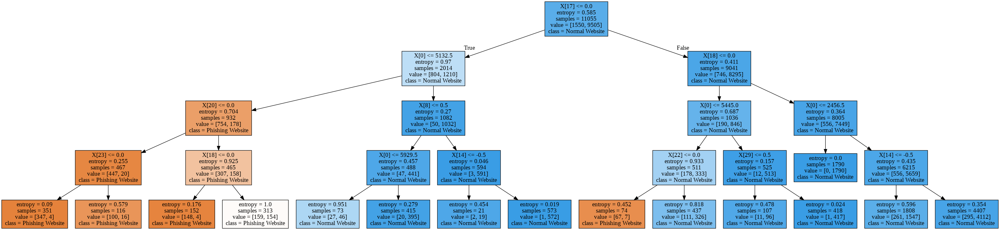

In [ ]:
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

# MODEL ANALYSIS

In [ ]:
def train_eval_pipeline(model,train_data,test_data,name):
  #Initialize Weights and Biases
  wandb.init(project="Using Phishing Dataset on Decision Tree Classifier", name=name)
  #segregate the datasets
  (x_train,y_train)=train_data
  (x_test,y_test)=test_data
 
  # train and log all necessary metrics
  start=time.time()
  model.fit(x_train,y_train)
  end=time.time()-start
  prediction=model.predict(x_test)
  wandb.log({"accuracy": accuracy_score(y_test,prediction)*100.0,
             "precision": precision_recall_fscore_support(y_test,prediction,average='macro')[0],
             'recall': precision_recall_fscore_support(y_test,prediction,average='macro')[1],
             'Training_time':end})
  print("Accuracy score of the Decision Tree Classifier with default hyperparameter values {0:.2f}%"\
  .format(accuracy_score(y_test,prediction)*100.0))
  print('\n')
  print("---Classification report of the Decision Tree classifier with default hyperparameter values----")
  print('\n')
  print(classification_report(y_test,prediction,target_names=['Phishing Websites','Normal Websites'])) 

In [ ]:
train_eval_pipeline(clf,(x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

<IPython.core.display.Javascript object>

wandb: ERROR Not authenticated.  Copy a key from https://app.wandb.ai/authorize


API Key: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Accuracy score of the Decision Tree Classifier with default hyperparameter values 92.27%


---Classification report of the Decision Tree classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.83      0.54      0.65       300
  Normal Websites       0.93      0.98      0.96      1911

         accuracy                           0.92      2211
        macro avg       0.88      0.76      0.81      2211
     weighted avg       0.92      0.92      0.92      2211



Accuracy score of the Decision Tree Classifier with default hyperparameter values 92.27% as seen above.

# CAN WE FURTHER OPTIMIZE THE MODEL?

When using decision tree classifier, we note that the higher the max depth, the higher the accuracy. Therefore, we want to put this to the test by further optimizng the model.

## a) max depth = 15

In [ ]:
clf2=tree.DecisionTreeClassifier(criterion='entropy',max_depth=15)

In [ ]:
clf2.fit(x,y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
clf2

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
dot_data=tree.export_graphviz(clf2,class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)

In [ ]:
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.827721 to fit



In [ ]:
train_eval_pipeline(clf2,(x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 91.86%


---Classification report of the Decision Tree classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.71      0.68      0.69       300
  Normal Websites       0.95      0.96      0.95      1911

         accuracy                           0.92      2211
        macro avg       0.83      0.82      0.82      2211
     weighted avg       0.92      0.92      0.92      2211



Using a max depth of 15, the accuracy drops from 92.27% to 91.86%

## b) max depth = 12

In [ ]:
clf3=tree.DecisionTreeClassifier(criterion='entropy',max_depth=12)

In [ ]:
clf3.fit(x,y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=12, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
clf3

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=12, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
dot_data=tree.export_graphviz(clf3,class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)

In [ ]:
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [ ]:
train_eval_pipeline(clf3,(x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 92.31%


---Classification report of the Decision Tree classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.76      0.63      0.69       300
  Normal Websites       0.94      0.97      0.96      1911

         accuracy                           0.92      2211
        macro avg       0.85      0.80      0.82      2211
     weighted avg       0.92      0.92      0.92      2211



When using a max depth of 12, the accuracy increases compared to 15 (from 91.86% to 92.31%).
With a max depth of 12, the accuracy of 92.31% is higher than the accuracy of a max depth of 4, 92.27%


# CONCLUSION

1. The higher the max depth, the higher the accuracy until a certain value from which the accuracy lowers.
2. Accuracy using a Decision Tree is higher than using a logistics model. We proved so by using the same phishing dataset. The decion tree classifier had a highest possible accuracy of 92.31% while that of the Logistics Regresssion Classifier came to 91.72%